## Testing the dataloader

In [1]:
from data_modules.ocelot import OcelotDataModule
from models.comp_seg import CompositeSegmentationModel
from models.dynunet import DynUNetModel
from ocelot_util import (
    normalize_crop_coords_batch,
    evaluate_cell_detection_batch, 
    cell_detection_postprocessing_batch, 
    calculate_metrics, 
    load_ground_truth,
    compute_class_weights,
    weighted_mse_loss,
)
import monai.transforms as T
from lightning.pytorch import seed_everything

seed_everything(42)

[rank: 0] Seed set to 42


42

In [2]:
data_module = OcelotDataModule(batch_size=4, num_workers=1)
data_module.prepare_data()
data_module.setup()
train_set = data_module.train_set
val_set = data_module.val_set

Train: 400 | Val: 137 | Test: 126


In [3]:
train_loader = data_module.train_dataloader()
batch = next(iter(train_loader))
y_t = batch["label_tissue"]
y_c = batch["label_cropped_tissue"]
meta_batch = batch["meta"]
print(meta_batch)
cropped_coords = normalize_crop_coords_batch(meta_batch)
print(cropped_coords)
print("Available keys in batch:", batch.keys())

{'slide_name': ['TCGA-G2-A2EO-01Z-00-DX4.BE1980E2-83B2-4E04-A6A4-9B71B15793B5', 'TCGA-WW-A8ZI-01Z-00-DX1.D8EA0F9D-EF79-489E-9AB7-C07CBBF4AAC2', 'TCGA-AX-A0IU-01Z-00-DX2.B8A89AB7-F119-49CB-BC05-F200F11DC5DE', 'TCGA-BK-A13B-01Z-00-DX2.94ED8CB1-3FF7-42FC-8E1E-D089C6AE4B98'], 'cell_patch': {'x_start': tensor([ 40150,  23640,   3228, 108272]), 'y_start': tensor([27302,  6304, 22596,  4848]), 'x_end': tensor([ 40952,  24428,   4034, 109079]), 'y_end': tensor([28104,  7092, 23402,  5655]), 'resized_mpp_x': tensor([0.1942, 0.1945, 0.1943, 0.1943], dtype=torch.float64), 'resized_mpp_y': tensor([0.1942, 0.1945, 0.1943, 0.1943], dtype=torch.float64)}, 'tissue_patch': {'x_start': tensor([ 38544,  22064,   3228, 106656]), 'y_start': tensor([25696,  6304, 22596,  3232]), 'x_end': tensor([ 41755,  25216,   6455, 109887]), 'y_end': tensor([28907,  9456, 25823,  6463]), 'resized_mpp_x': tensor([0.7777, 0.7778, 0.7778, 0.7778], dtype=torch.float64), 'resized_mpp_y': tensor([0.7777, 0.7778, 0.7778, 0.777

In [4]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
from matplotlib import cm

def normalize_image(img):
    if img.min() < 0 or img.max() > 1:
        img = (img - img.min()) / (img.max() - img.min())    
    return img

def visualize_data(tissue_img, cell_img, label_tissue, label_cropped_tissue, soft_is_mask, coords = None):
    tissue_img = normalize_image(tissue_img)
    cell_img = normalize_image(cell_img)

    if tissue_img.ndim == 3 and tissue_img.shape[0] == 3:
        tissue_img = np.transpose(tissue_img, (1, 2, 0))  # Convert (3, height, width) to (height, width, 3)
    
    if cell_img.ndim == 3 and cell_img.shape[0] == 3:
        cell_img = np.transpose(cell_img, (1, 2, 0)) 

    fig, axes = plt.subplots(3, 2, figsize=(12, 20))

 
    axes[0, 0].imshow(tissue_img)
    axes[0, 0].set_title("Tissue Image")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cell_img)
    axes[0, 1].set_title("Cell Image")
    axes[0, 1].axis('off')

    axes[1, 0].imshow(label_tissue[0], cmap='gray')
    axes[1, 0].set_title("Tissue Label")
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(cell_img)
    axes[1, 1].set_title("Cell Image With Mask")
    axes[1, 1].axis('off')
    axes[1, 1].imshow(soft_is_mask[2], cmap="Reds", alpha=0.4)  # Tumor in red
    axes[1, 1].imshow(soft_is_mask[1], cmap="Blues", alpha=0.4)  # Background cells in blue

    axes[2, 1].imshow(label_cropped_tissue[0], cmap='gray')
    axes[2, 1].set_title("Label Cropped Tissue")
    axes[2, 1].axis('off')

    
    plt.tight_layout()
    plt.show()
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Background Mask (Heatmap)
    cmap_bg = cm.get_cmap('Blues')  # Blue color map for background
    ax[0].imshow(soft_is_mask[0], cmap=cmap_bg)
    ax[0].set_title('Background Mask (Heatmap)')
    ax[0].axis('off')

    # Background Cell Mask (Heatmap)
    cmap_bc = cm.get_cmap('Greens')  # Green color map for background cells
    ax[1].imshow(soft_is_mask[1], cmap=cmap_bc)
    ax[1].set_title('Background Cells (Heatmap)')
    ax[1].axis('off')

    # Tumor Mask (Heatmap)
    cmap_tc = cm.get_cmap('Reds')  # Red color map for tumor cells
    ax[2].imshow(soft_is_mask[2], cmap=cmap_tc)
    ax[2].set_title('Tumor Cells (Heatmap)')
    ax[2].axis('off')

    plt.show()

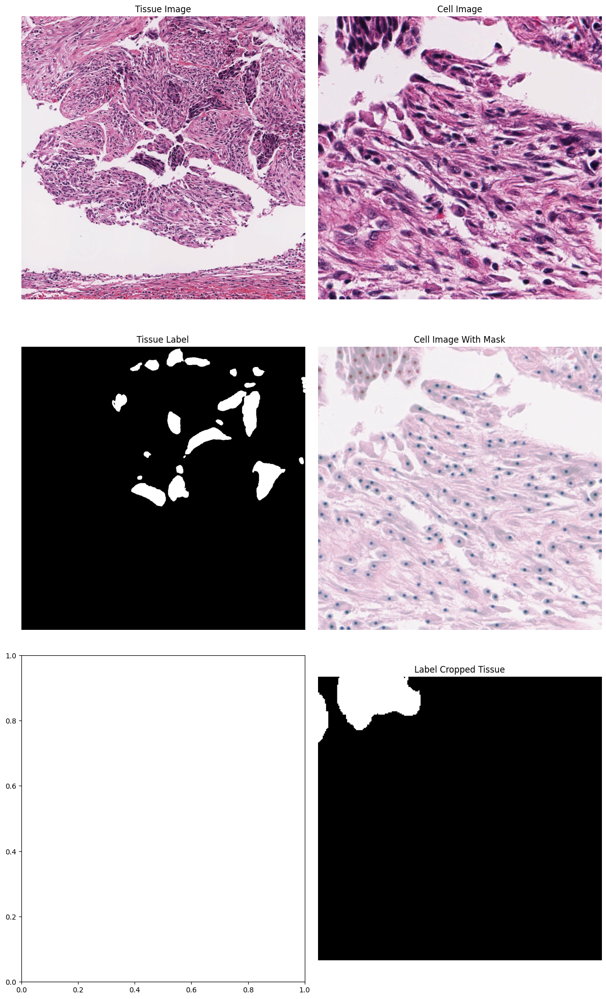

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


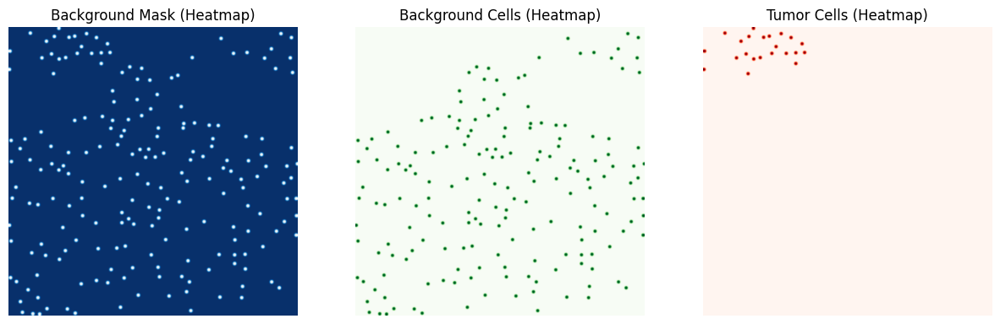

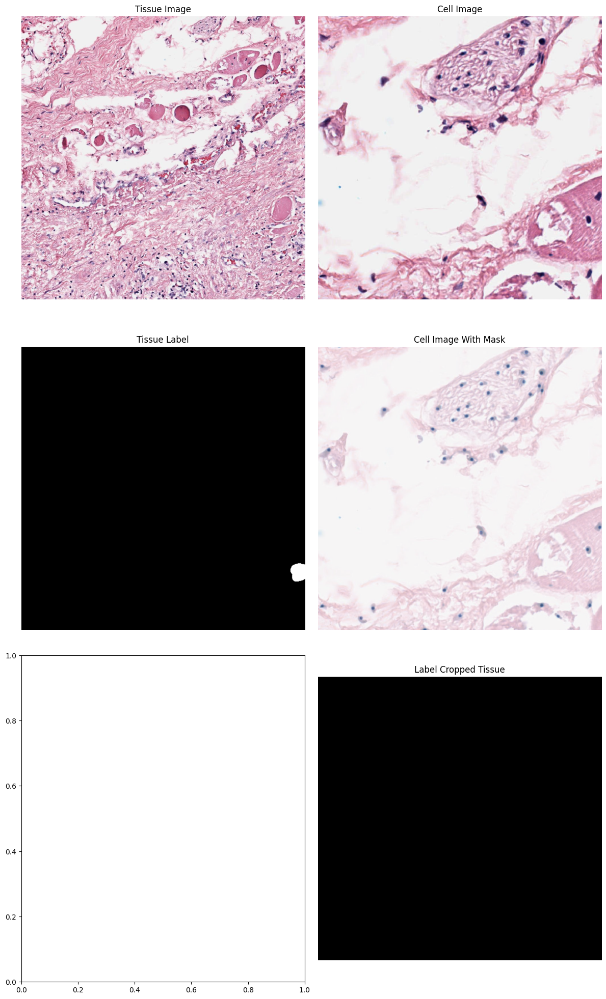

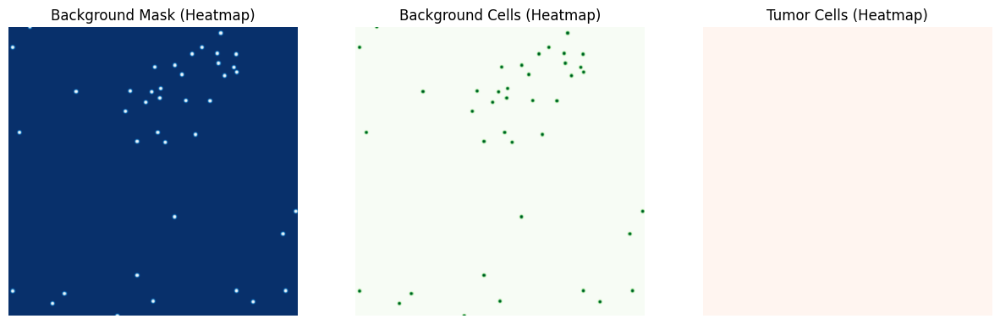

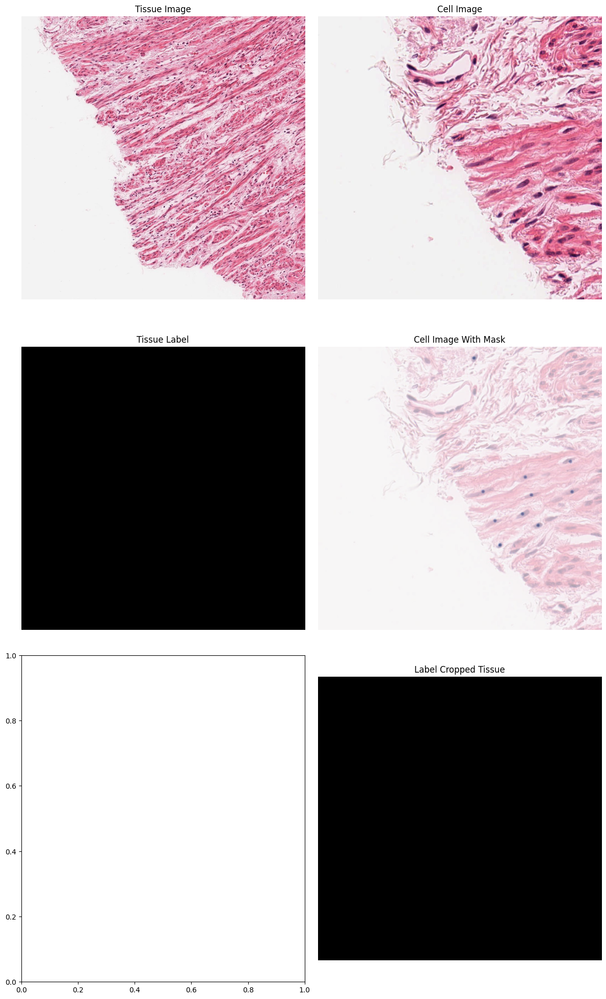

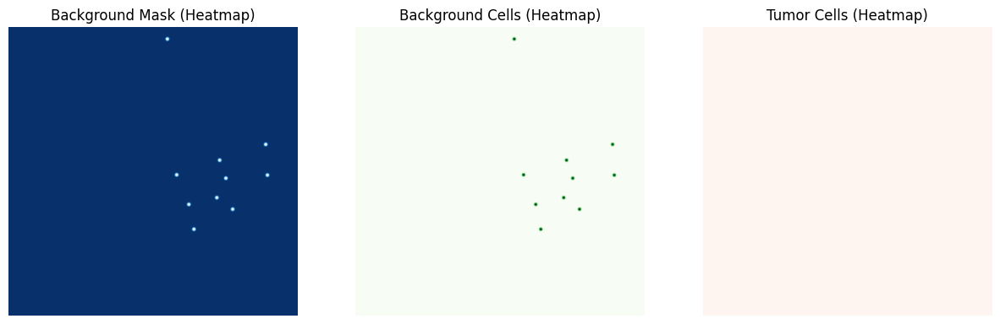

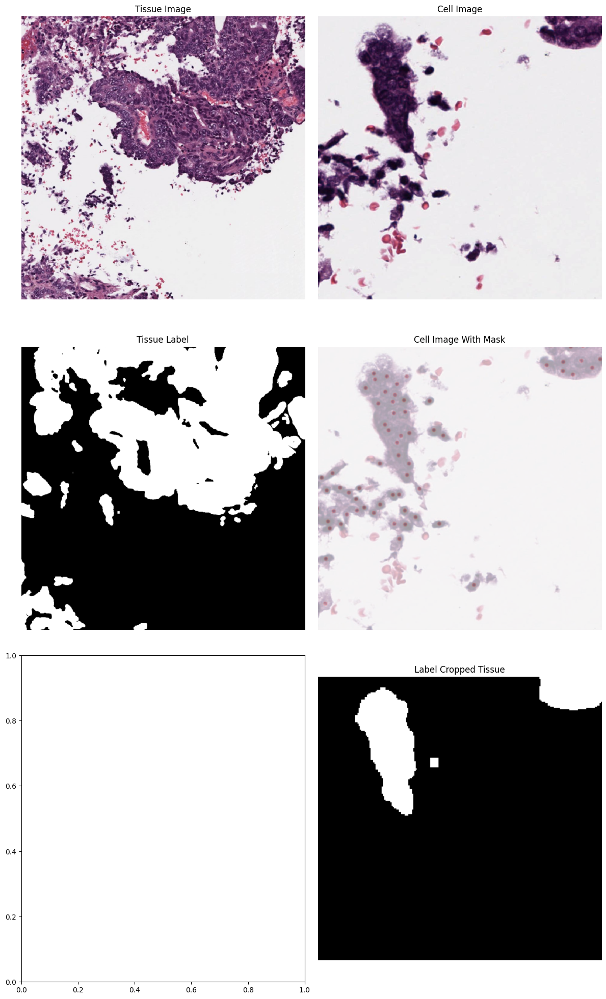

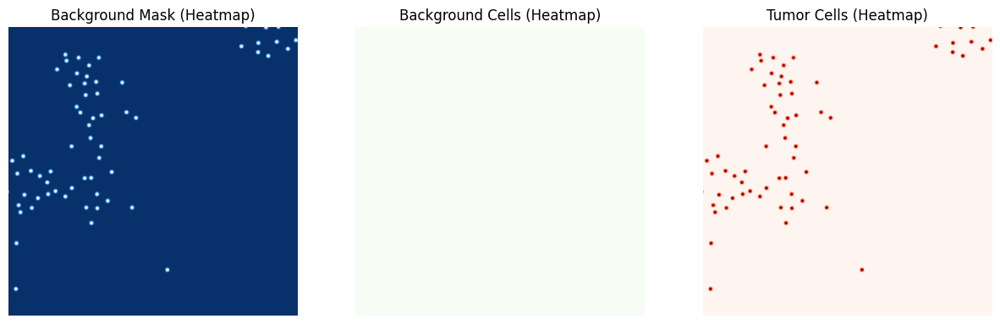

In [5]:
for i in range(4):
    tissue_img = batch['img_tissue'][i]
    cell_img = batch['img_cell'][i]
    label_tissue = batch['label_tissue'][i]
    label_cropped_tissue = batch['label_cropped_tissue'][i]

    soft_is_mask = batch['soft_is_mask'][i]
    label_cell = batch["label_cell"][i]
    #label_cell_mask = batch['label_cell_mask'][i]

    visualize_data(tissue_img = tissue_img, cell_img = cell_img, label_tissue = label_tissue, label_cropped_tissue = label_cropped_tissue,
     soft_is_mask = soft_is_mask)

In [6]:
val_loader = data_module.val_dataloader()
batch = next(iter(val_loader))

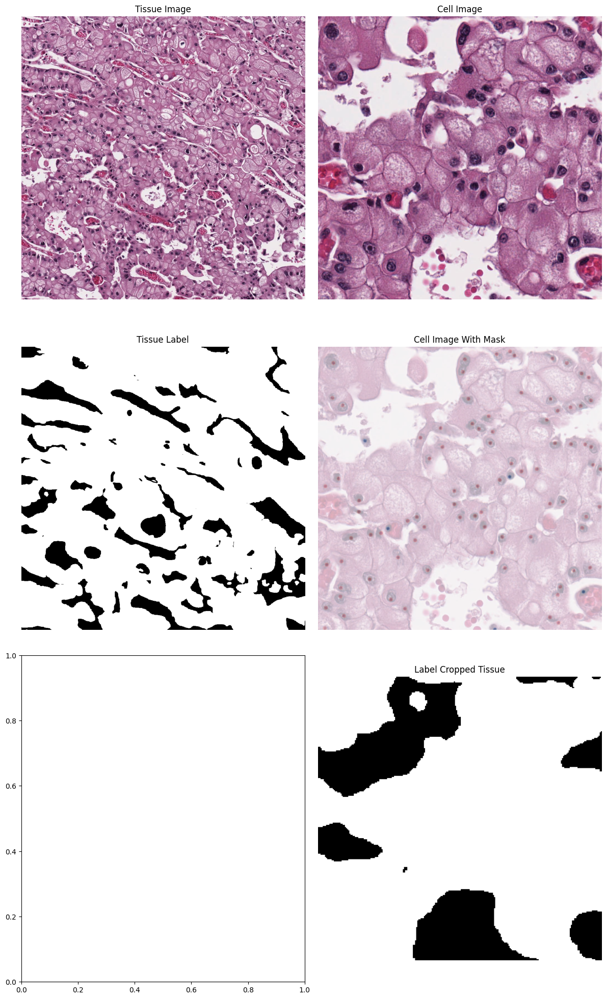

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


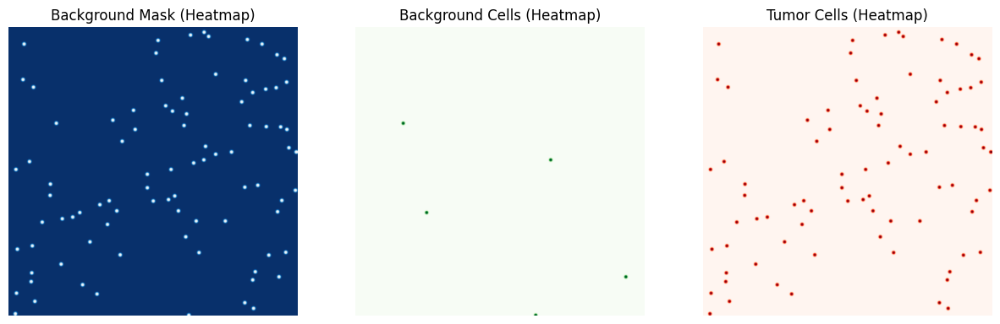

In [7]:
for i in range(val_loader.batch_size):
    tissue_img = batch['img_tissue'][i]
    cell_img = batch['img_cell'][i]
    label_tissue = batch['label_tissue'][i]
    label_cropped_tissue = batch['label_cropped_tissue'][i]

    soft_is_mask = batch['soft_is_mask'][i]
    #label_cell_mask = batch['label_cell_mask'][i]

    visualize_data(tissue_img = tissue_img, cell_img = cell_img, label_tissue = label_tissue, label_cropped_tissue = label_cropped_tissue,
     soft_is_mask = soft_is_mask,)

## Testing Util - Postprocessing and evaluation

In [8]:
gt_cells_list, gt_classes_list = load_ground_truth(batch)
print(gt_cells_list)
print(gt_classes_list)

[array([[ 978,  836],
       [  47,  529],
       [  28,  644],
       [ 658,  252],
       [ 451,  733],
       [ 341,  169],
       [ 570,  491],
       [ 308,  630],
       [ 330,  369],
       [ 630,  323],
       [ 443,  789],
       [ 776,   84],
       [ 947,  313],
       [1017,   24],
       [ 744,  627],
       [ 505,   26],
       [ 112,  976],
       [ 354,  963],
       [ 599,  588],
       [ 897,  864],
       [ 167,  733],
       [ 597,  147],
       [1022,  638],
       [ 295,  442],
       [ 220,  910],
       [ 652,  383],
       [ 700,  350],
       [ 973,   93],
       [ 674,  227],
       [ 788,   31],
       [ 652,  601],
       [ 561,  882],
       [ 998,  867],
       [ 423,  697],
       [ 265,  825],
       [ 232,  864],
       [ 428,  992],
       [  60,   55],
       [  92,  522],
       [  33,  708],
       [  44,  845],
       [ 914,  262],
       [  18,  692],
       [ 886,  957],
       [ 762,  288],
       [ 944,   28],
       [ 903,   80],
       [ 872

In [9]:
cell_post_transform = T.Activations(softmax = True,  dim=-1) 
fake_pred = cell_post_transform(batch['soft_is_mask'])
pred_cells_list, pred_classes_list, confidences_list = cell_detection_postprocessing_batch(fake_pred)

In [10]:
print(pred_cells_list)
print(pred_classes_list)



[array([[ 998,  867],
       [ 167,  733],
       [ 471,  691],
       [ 886,  957],
       [ 112,  976],
       [ 522,  491],
       [ 841,  186],
       [ 405,  402],
       [ 341,  169],
       [ 762,  288],
       [ 658,  252],
       [ 330,  369],
       [ 279,  556],
       [ 744,  627],
       [ 265,  825],
       [ 252,  615],
       [ 630,  323],
       [ 232,  864],
       [ 776,   84],
       [ 914,  262],
       [ 788,   31],
       [  18,  692],
       [ 308,  630],
       [ 579, 1015],
       [ 700,  350],
       [ 451,  733],
       [  98,  950],
       [ 897,  864],
       [  92,  522],
       [ 674,  227],
       [ 903,   80],
       [1018,   24],
       [ 680,  190],
       [ 423,  697],
       [ 428,  992],
       [ 477,   74],
       [ 482,  655],
       [ 978,  836],
       [ 973,   93],
       [  33,  708],
       [  28,  644],
       [ 195,  984],
       [ 220,  910],
       [ 868,  873],
       [ 872,   82],
       [ 557,  148],
       [ 561,  882],
       [ 944

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cell_detections(gt_cells, gt_classes, pred_cells, pred_classes, image, image_shape=(1024, 1024)):
    def normalize_image(img):
        return (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1] for display

    image = normalize_image(image)
    
    # Ensure image is (H, W, C)
    if image.ndim == 3 and image.shape[0] == 3:
        image = np.transpose(image, (1, 2, 0))  
    
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))
    fig.suptitle("Ground Truth vs. Predictions", fontsize=16)
    # Extract coordinates per class
    gt_cells_1 = gt_cells[gt_classes == 1]
    
    gt_cells_2 = gt_cells[gt_classes == 2]  
    pred_cells_1 = pred_cells[pred_classes == 1]
    pred_cells_2 = pred_cells[pred_classes == 2]

    categories = [
        ("GT Class 1", gt_cells_1, 'blue', 'o'),
        ("Pred Class 1", pred_cells_1, 'red', 'x'),
        ("Both Class 1", (gt_cells_1, pred_cells_1), ('blue', 'red'), ('o', 'x')),
        ("GT Class 2", gt_cells_2, 'blue', 'o'),
        ("Pred Class 2", pred_cells_2, 'red', 'x'),
        ("Both Class 2", (gt_cells_2, pred_cells_2), ('blue', 'red'), ('o', 'x')),
    ]

    for i in range(2):  # First two rows without image
        for j in range(3):
            title, cells, color, marker = categories[i * 3 + j]
            if isinstance(cells, tuple):
                axes[i, j].scatter(cells[0][:, 1], cells[0][:, 0], c=color[0], marker=marker[0], label="GT")
                axes[i, j].scatter(cells[1][:, 1], cells[1][:, 0], c=color[1], marker=marker[1], label="Pred")
            else:
                axes[i, j].scatter(cells[:, 1], cells[:, 0], c=color, marker=marker)
    
    for i in range(2, 4):  
        for j in range(3):
            title, cells, color, marker = categories[(i - 2) * 3 + j]
            axes[i, j].imshow(image, extent=[0, image_shape[1], image_shape[0], 0])  # Keep correct scaling
            if isinstance(cells, tuple):
                axes[i, j].scatter(cells[0][:, 1], cells[0][:, 0], c=color[0], marker=marker[0], label="GT")
                axes[i, j].scatter(cells[1][:, 1], cells[1][:, 0], c=color[1], marker=marker[1], label="Pred")
                axes[i, j].set_title(title)
            else:
                axes[i, j].scatter(cells[:, 1], cells[:, 0], c=color, marker=marker)
                axes[i, j].set_title(title)



    
   
    # Formatting
    for ax in axes.flat:
        ax.set_xlim(0, image_shape[1])
        ax.set_ylim(image_shape[0], 0)  # Keep image-like axis
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal')  # Maintain square plots
        ax.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Adjust space for title
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


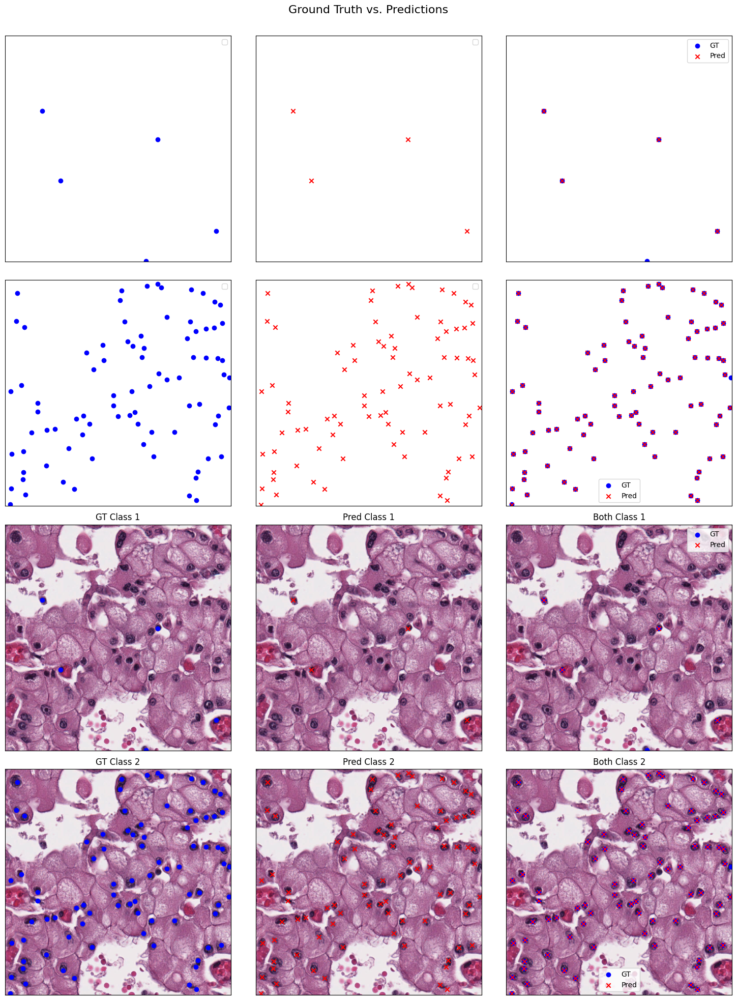

In [12]:
image = batch['img_cell'][0]
plot_cell_detections(gt_cells_list[0], gt_classes_list[0], pred_cells_list[0], pred_classes_list[0], image)

In [13]:
total_tp_bc, total_fp_bc, total_fn_bc, total_tp_tc, total_fp_tc, total_fn_tc = evaluate_cell_detection_batch(
                pred_cells_list, pred_classes_list, gt_cells_list, gt_classes_list,
            )

In [14]:
print("TP, FP, FN for BC")
print(total_tp_bc)
print(total_fp_bc)
print(total_fn_bc)

print("TP, FP, FN for TC")

print(total_tp_tc)
print(total_fp_tc)
print(total_fn_tc)


TP, FP, FN for BC
4
0
1
TP, FP, FN for TC
83
0
1


In [15]:
def calculate_metrics(tp, fp, fn):
    # Precision, Recall, and F1 score calculation
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return precision, recall, f1

# Calculate precision, recall, and F1 for BC (Class 1)
precision_bc, recall_bc, f1_bc = calculate_metrics(total_tp_bc, total_fp_bc, total_fn_bc)

# Calculate precision, recall, and F1 for TC (Class 2)
precision_tc, recall_tc, f1_tc = calculate_metrics(total_tp_tc, total_fp_tc, total_fn_tc)

# Print the results for BC
print("Precision, Recall, F1 for BC:")
print(f"Precision: {precision_bc:.4f}")
print(f"Recall: {recall_bc:.4f}")
print(f"F1 Score: {f1_bc:.4f}")

# Print the results for TC
print("Precision, Recall, F1 for TC:")
print(f"Precision: {precision_tc:.4f}")
print(f"Recall: {recall_tc:.4f}")
print(f"F1 Score: {f1_tc:.4f}")

# Calculate and print the average F1 score (mean F1)
mean_f1 = (f1_bc + f1_tc) / 2
print("Average F1 Score (mF1):")
print(f"{mean_f1:.4f}")

Precision, Recall, F1 for BC:
Precision: 1.0000
Recall: 0.8000
F1 Score: 0.8889
Precision, Recall, F1 for TC:
Precision: 1.0000
Recall: 0.9881
F1 Score: 0.9940
Average F1 Score (mF1):
0.9415


In [16]:
class_weights = compute_class_weights(batch['soft_is_mask'])
print(class_weights) 


metatensor([4.8055e-04, 9.4694e-01, 5.2579e-02])


In [17]:
loss = weighted_mse_loss(batch['soft_is_mask'], batch['soft_is_mask'], class_weights)
print(loss)

metatensor(0.)


In [18]:
def weighted_mse_loss_numpy(pred, target, class_weights):
    mse = (pred - target) ** 2 
    weighted_mse = mse * class_weights.reshape(1, -1, 1, 1) 
    return np.mean(weighted_mse)

y_pred = np.zeros((1, 3, 2, 2))  # 1 sample, 3 channels, 2x2 pixels (all zeros)
y_true = np.array([[
    [[1, 1], [1, 1]],  # Background class (channel 0)
    [[1, 1], [1, 1]],  # Background cells (channel 1)
    [[1, 1], [1, 1]],  # Tumor cells (channel 2)
]])  # True labels are all 1s

# Class weights (background, background cells, tumor cells)
class_weights = np.array([1.0, 10.0, 100.0])

# Compute weighted MSE loss
loss = weighted_mse_loss_numpy(y_pred, y_true, class_weights)
print("Weighted MSE Loss:", loss)

Weighted MSE Loss: 37.0
